# EXPERIMENT - STATE-GROUP-3

# State Groups:

- `group_1`: Patients with low toxicity and low tumor size  - W_0 ~ N(0.5, 0.16**2), T_0 ~ N(0.5, 0.16**2)
- `group_2`: Patients with high toxicity and low tumor size - W_0 ~ N(1.5, 0.16**2), T_0 ~ N(0.5, 0.16**2)
- `group_3`: Patients with low initial toxicity and high tumor size - W_0 ~ N(0.5, 0.16**2), T_0 ~ N(1.5, 0.16**2)
- `group_4`: Patients with high toxicity and high tumor size - W_0 ~ N(1.5, 0.16**2), T_0 ~ N(1.5, 0.16**2)
-  `None`  : Patients with toxicity and tumor size sample from - W_0 ~ U(0,2), T_0 ~  U(0,2)

In [10]:
%load_ext autoreload
%autoreload 2

import tqdm
import _set_path
from pbpi.algo_core.training import evaluations_per_config

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [11]:
ALGO_TYPE = {'original': {'name': 'original', 'exploration': False}
            ,'modified': {'name': 'modified', 'exploration': True} }

---
## Using `tumor size + toxicity` to generate preferences

### Original algorithm

In [12]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 3
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.05]
          , 'init_state_group': 'group_3'
          , 'init_state_tag': 'g3'
          }

algorithm = ALGO_TYPE['original']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 3


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.05


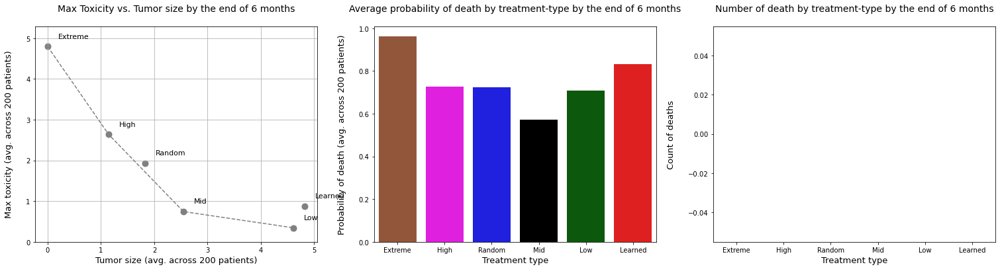

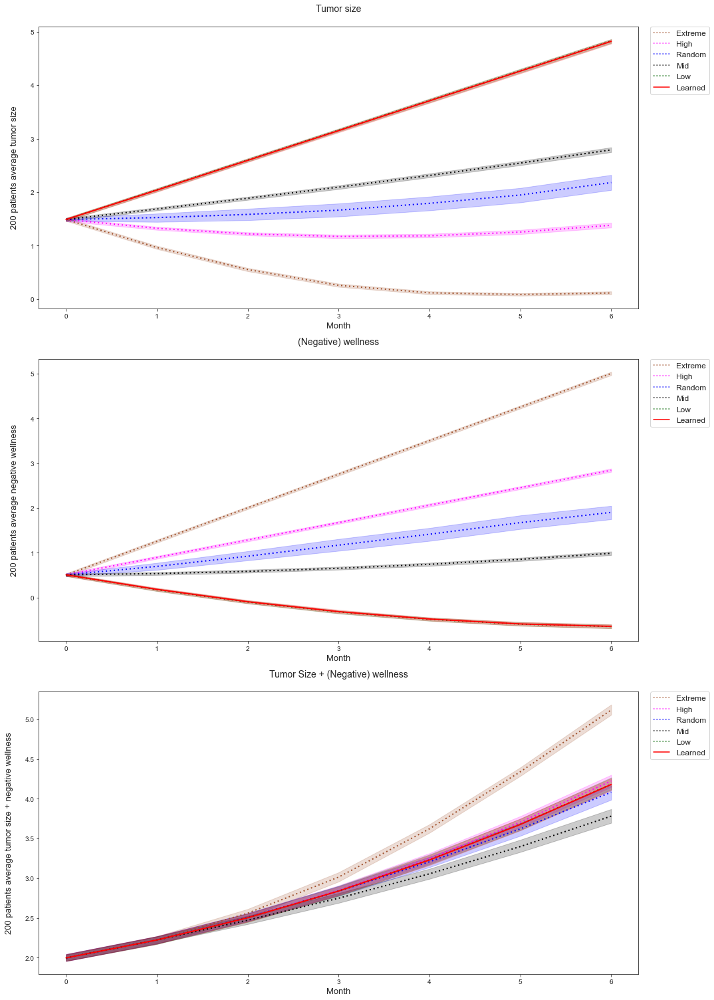


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 4.819387205749555
                         - Avg. max. toxicity : 0.8784746537185757
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.978168973389548
                         - Avg. prob. of death : 0.8319299335535996



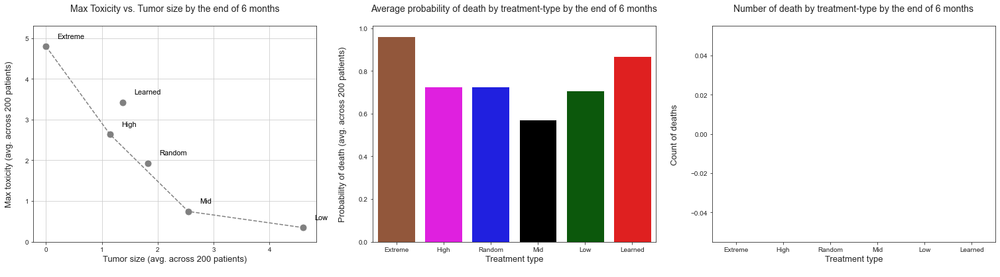

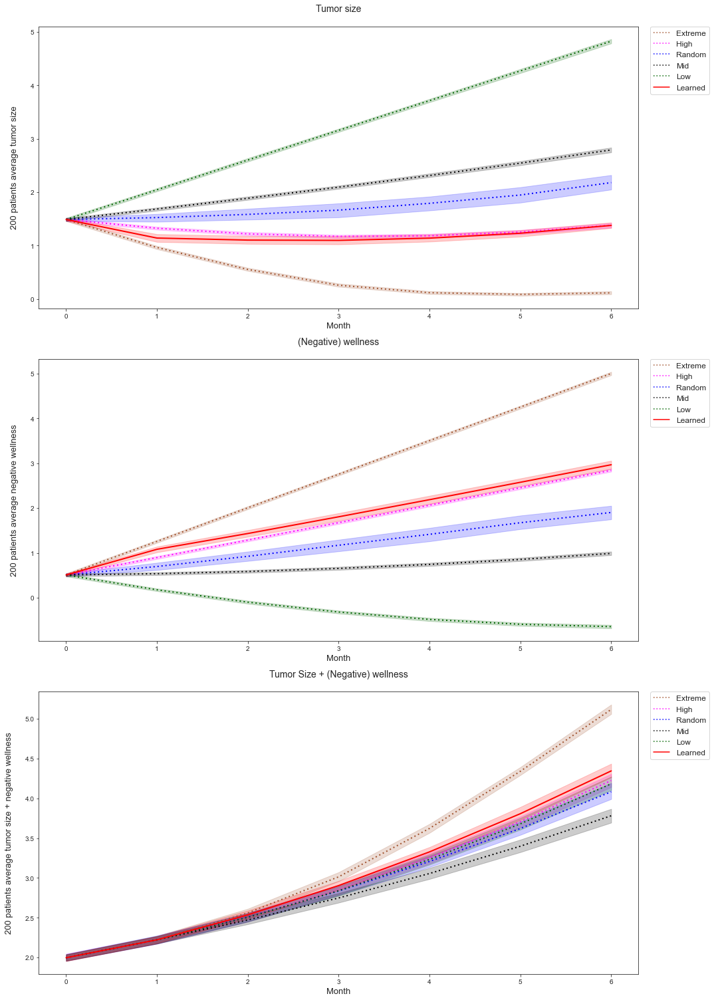


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 1.3778340809215768
                         - Avg. max. toxicity : 3.4226001634553205
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9899090597330034
                         - Avg. prob. of death : 0.8693208242588867



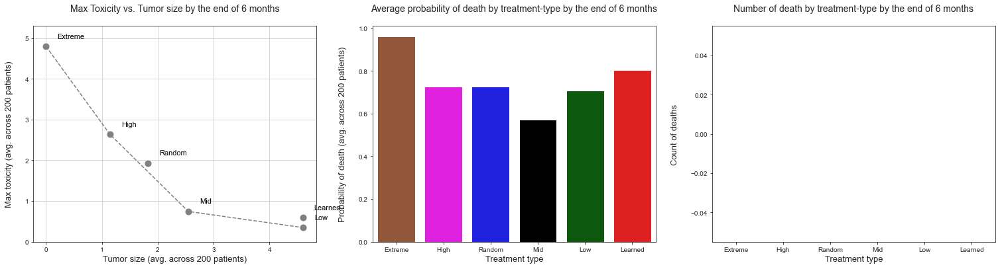

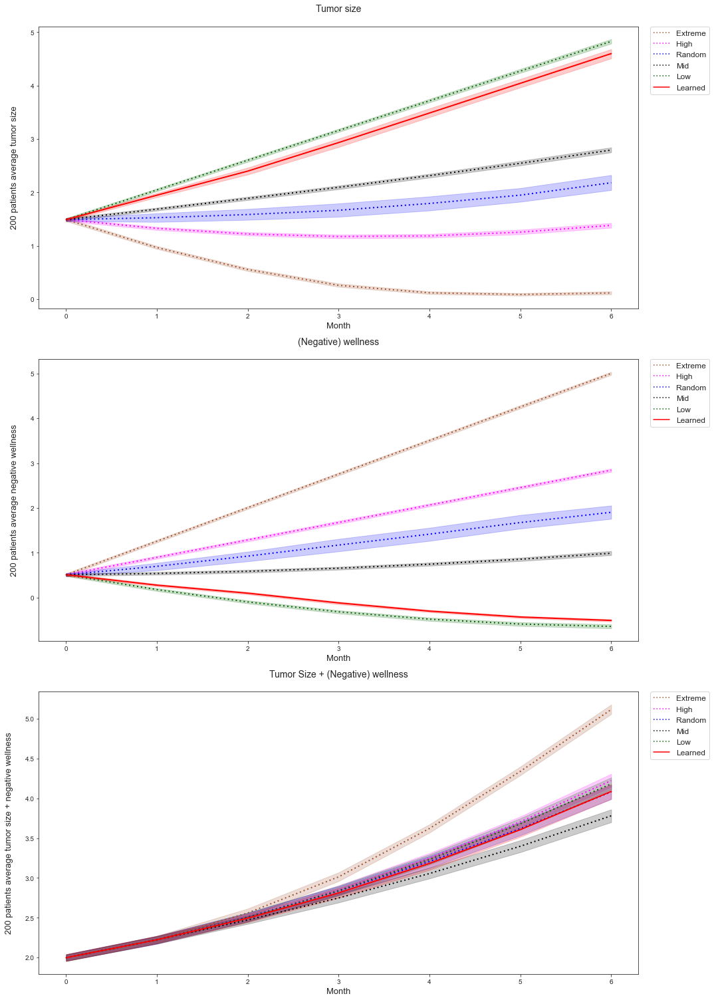


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 4.597878956108091
                         - Avg. max. toxicity : 0.5902187916655908
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9723950261761583
                         - Avg. prob. of death : 0.8028027464474828



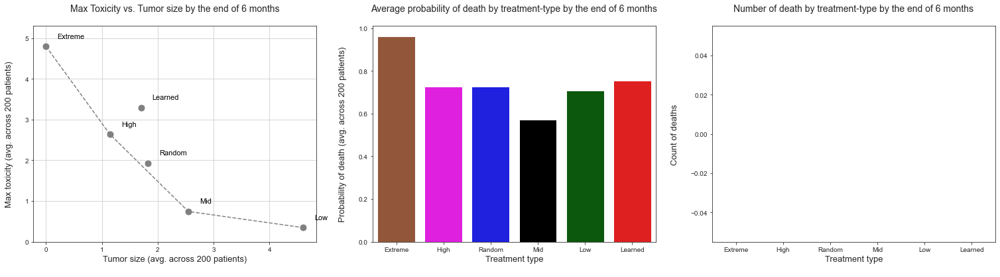

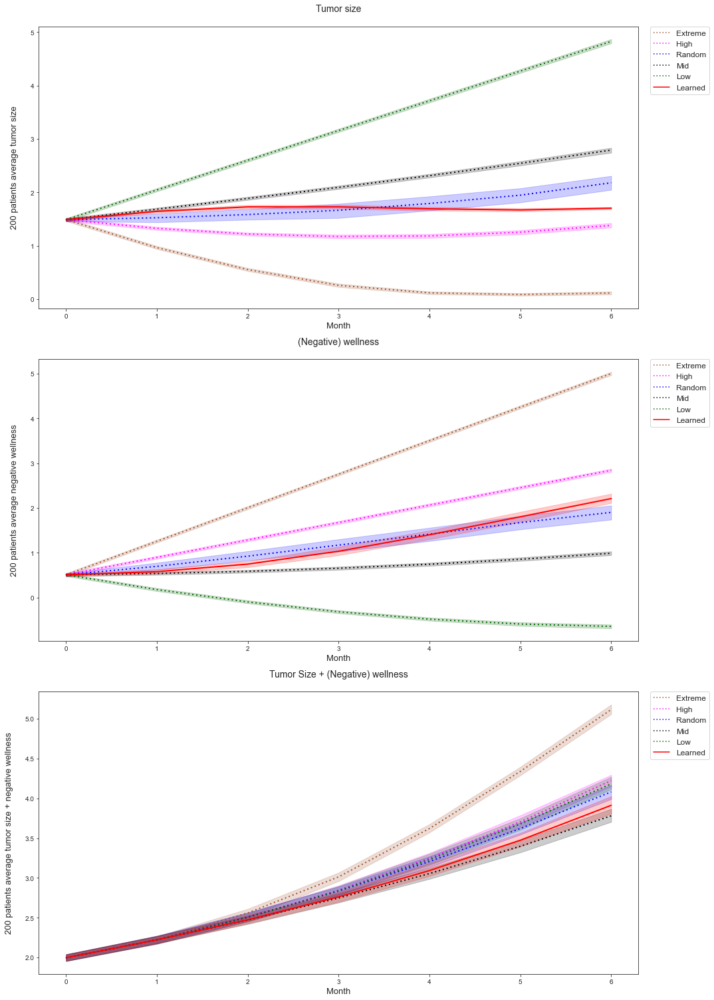


Policy Iteration: 4 - Evaluation results:
                         - Avg. ending tumor size : 1.703315446166355
                         - Avg. max. toxicity : 3.2917434835713095
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.961303829683516
                         - Avg. prob. of death : 0.7541707496944438



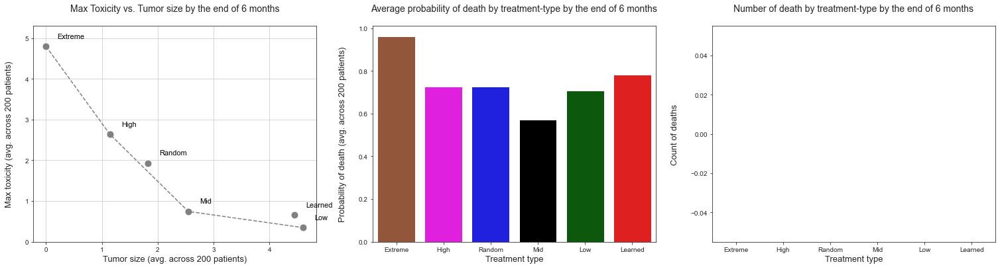

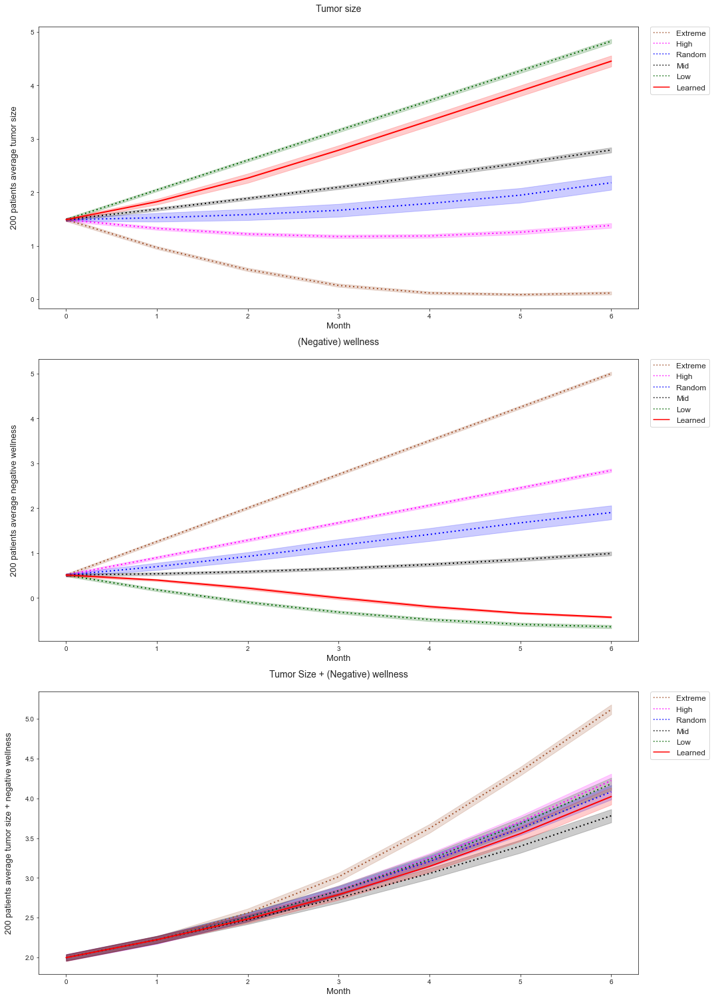


Policy Iteration: 5 - Evaluation results:
                         - Avg. ending tumor size : 4.453338674606873
                         - Avg. max. toxicity : 0.6600380286078033
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9679379493543334
                         - Avg. prob. of death : 0.7826575437662209



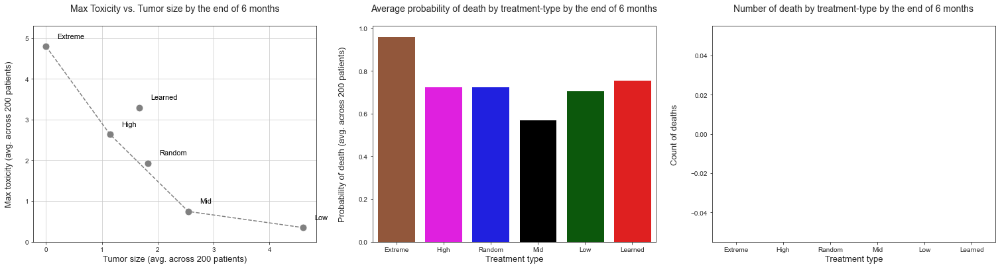

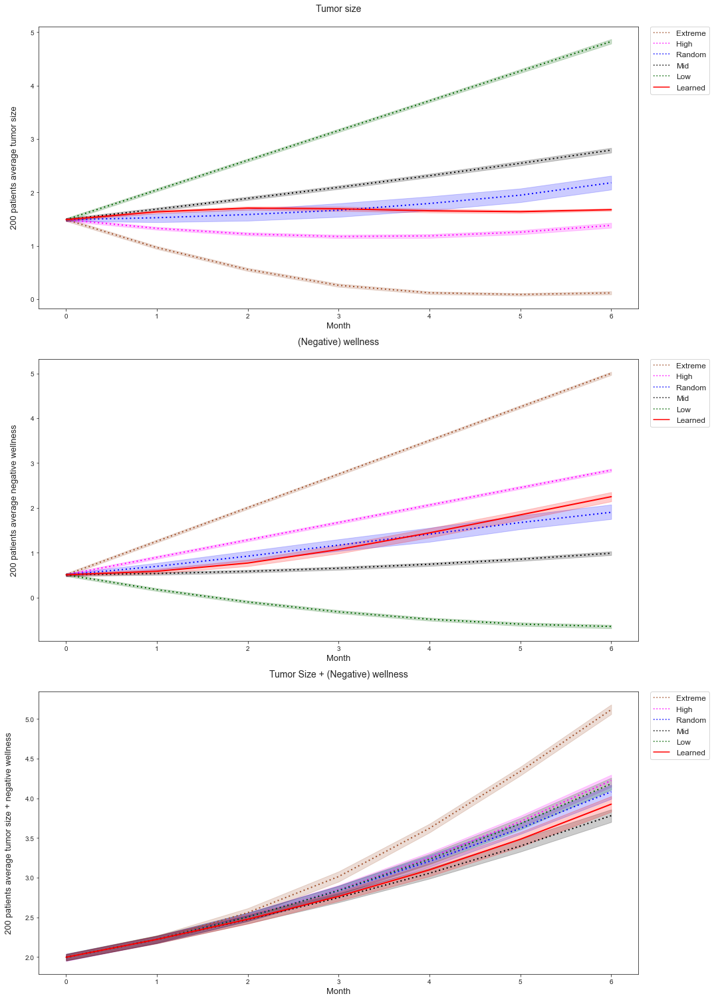


Policy Iteration: 6 - Evaluation results:
                         - Avg. ending tumor size : 1.674817539119592
                         - Avg. max. toxicity : 3.2917434835713095
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.962035318601244
                         - Avg. prob. of death : 0.7570690528480937



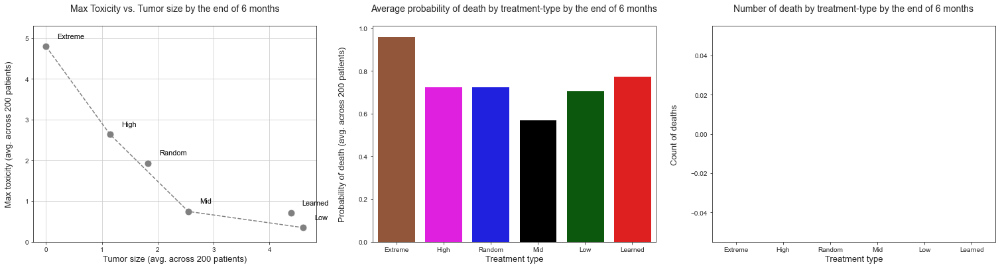

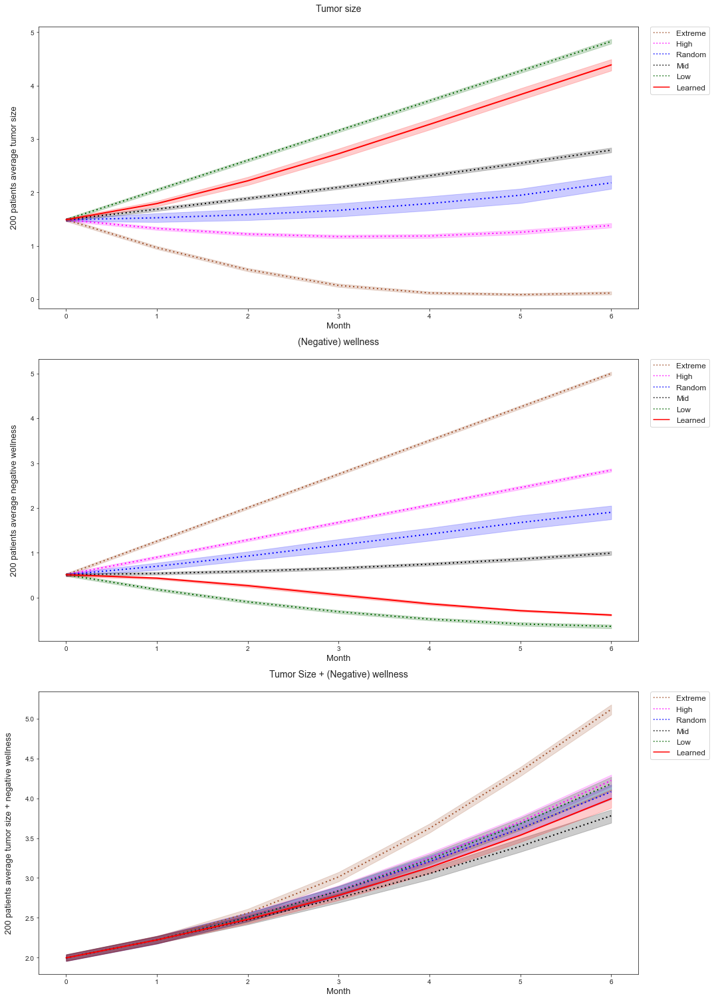


Policy Iteration: 7 - Evaluation results:
                         - Avg. ending tumor size : 4.386755097087508
                         - Avg. max. toxicity : 0.7039978724706721
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9662797688464155
                         - Avg. prob. of death : 0.7757020541737748



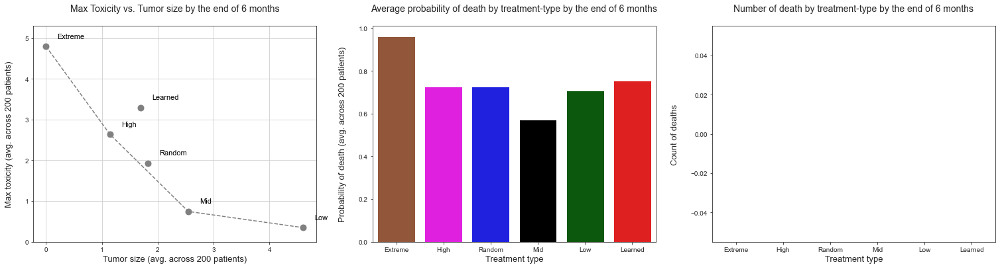

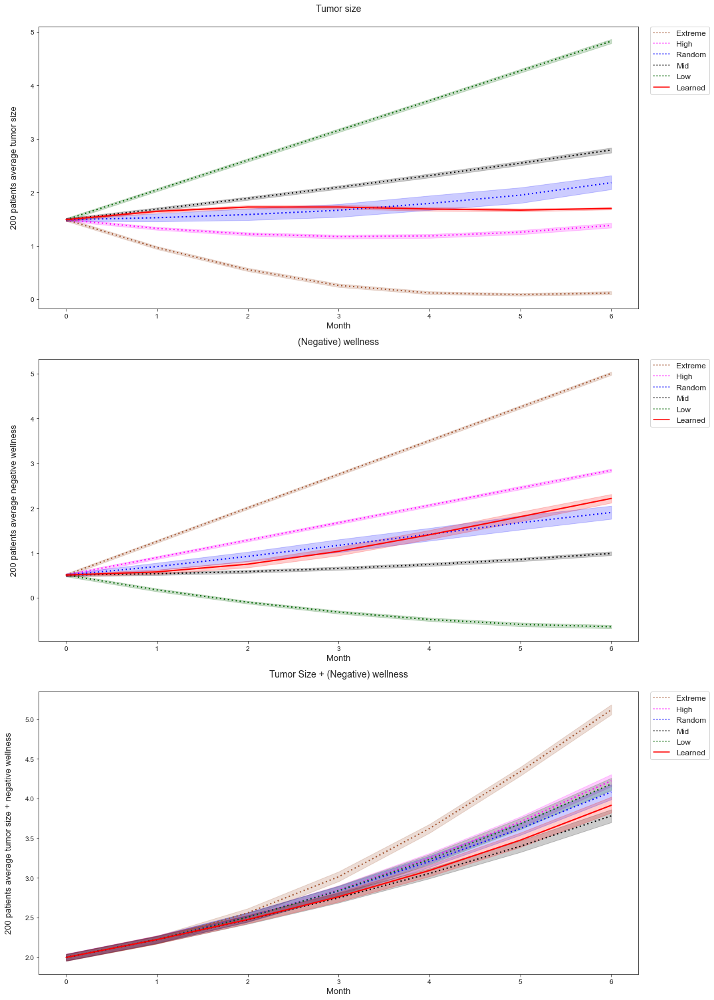


Policy Iteration: 8 - Evaluation results:
                         - Avg. ending tumor size : 1.6985375740220516
                         - Avg. max. toxicity : 3.2917434835713095
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.961368373294246
                         - Avg. prob. of death : 0.7544918164454306



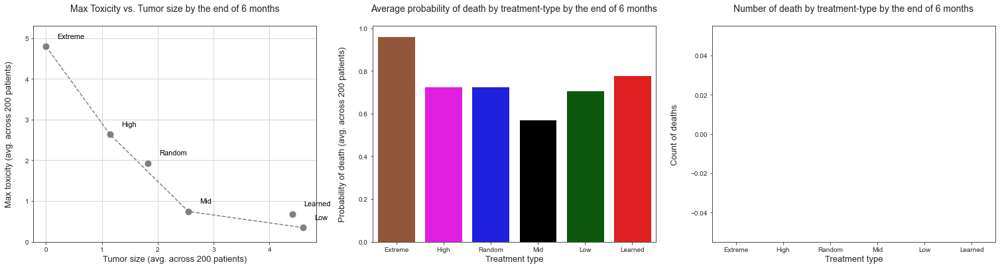

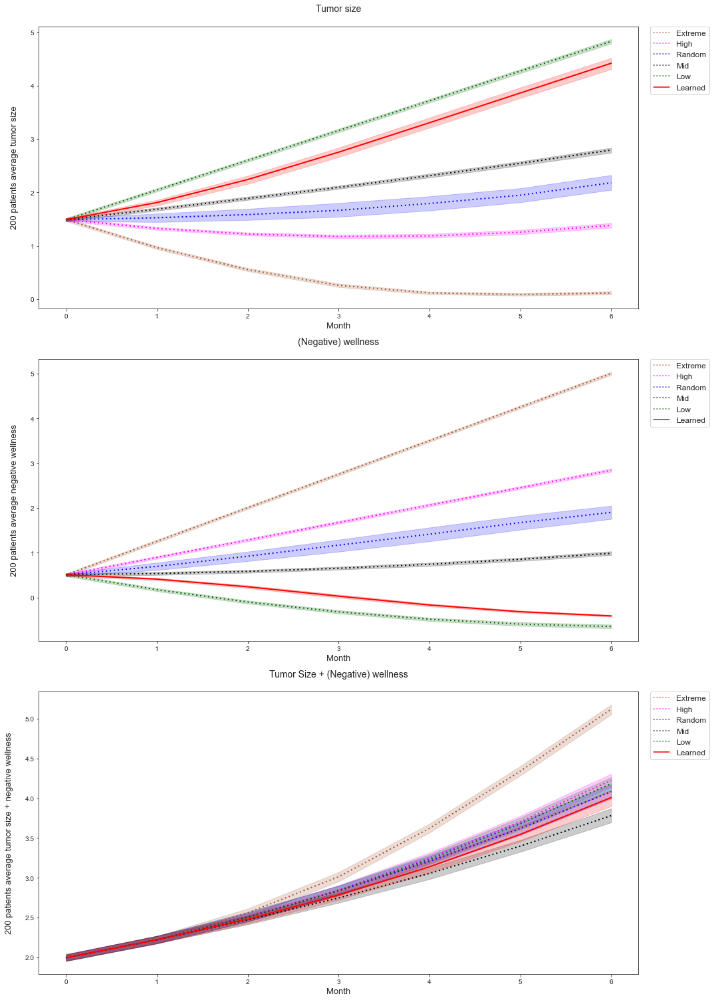


Policy Iteration: 9 - Evaluation results:
                         - Avg. ending tumor size : 4.416674117136637
                         - Avg. max. toxicity : 0.6801139810808416
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9670717588510427
                         - Avg. prob. of death : 0.7788200374830904



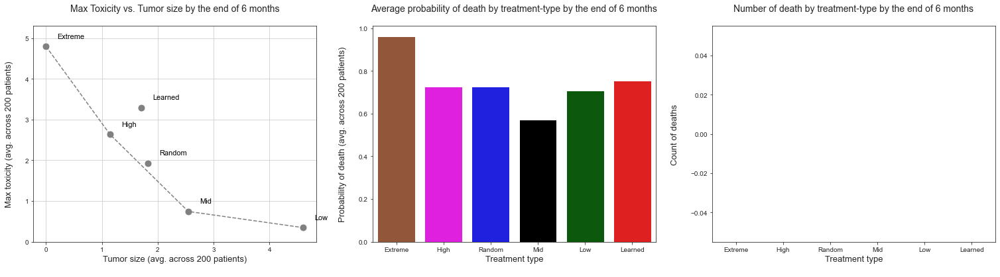

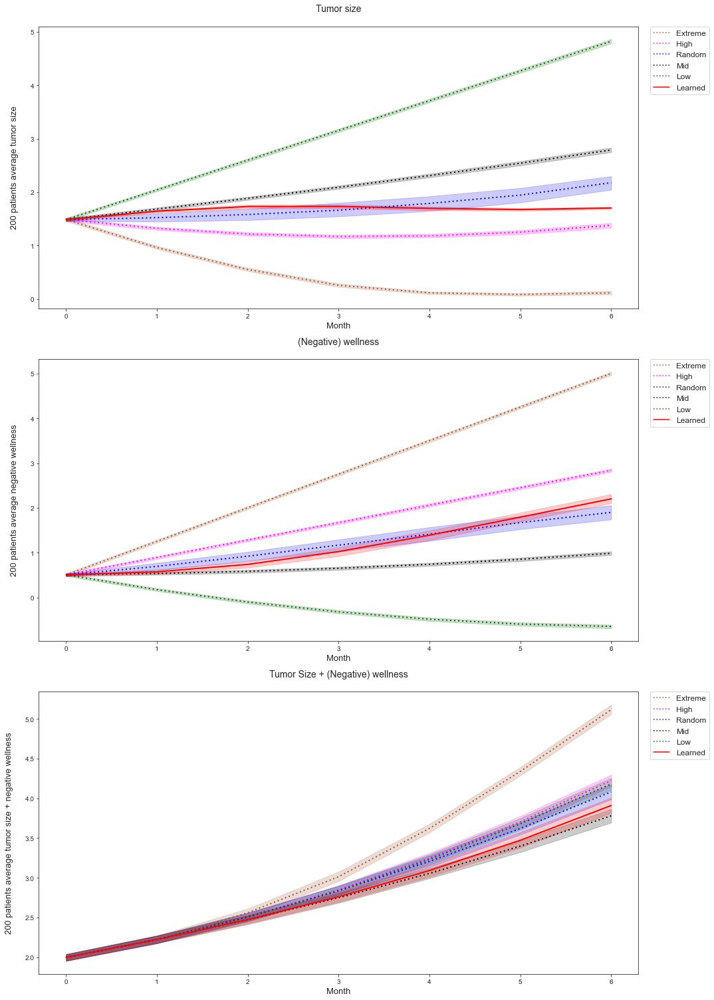


Policy Iteration: 10 - Evaluation results:
                         - Avg. ending tumor size : 1.7061414611829897
                         - Avg. max. toxicity : 3.2917434835713095
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.961168915568086
                         - Avg. prob. of death : 0.7536962025149252


Evaluations: 100%|██████████| 1/1 [3:45:30<00:00, 13530.71s/it]


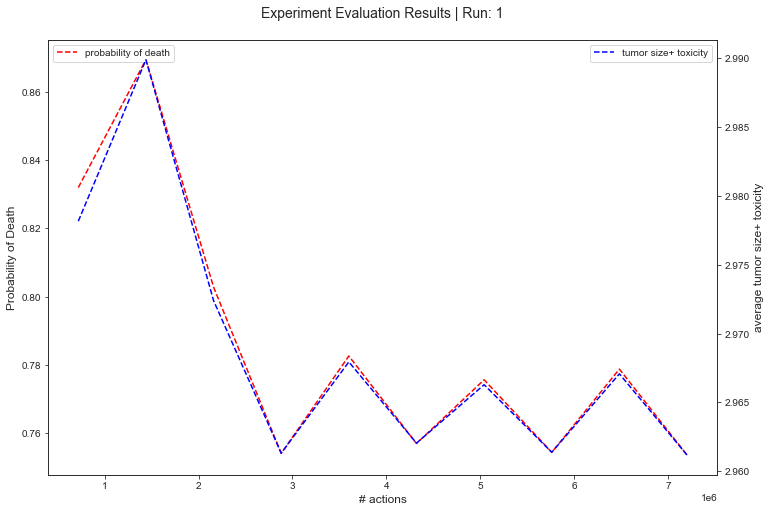

In [7]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 12
                                                , treatment_length_eval     = 12
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = True # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 16
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()

### Modified algorithm

In [8]:
############################################
################## INPUTS ##################

# Configs to test
N_STATES = 1000

configs = { 'CONFIG_NO': 4
          , 'S': [N_STATES]
          , 'Actions' : [6]
          , 'Roll-outs': [10]
          , 'Significance' : [0.05]
          , 'init_state_group': 'group_3'
          , 'init_state_tag': 'g3'
          }

algorithm = ALGO_TYPE['modified']

############################################
############################################

# Algorithm configs
ALGO_NAME = algorithm['name']
EXPLORE_LOGIC = algorithm['exploration']

Runs:   0%|          | 0/1 [00:00<?, ?it/s]
State generation seed is 3


Currently evaluated configs:
 Samples: 1000 | Actions: 6 | Roll-outs: 10 | Significance: 0.05


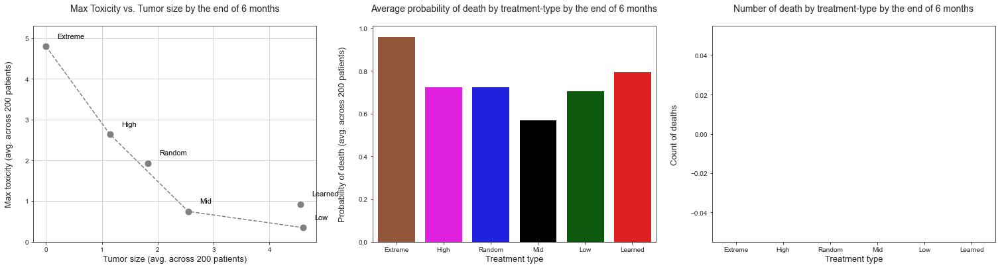

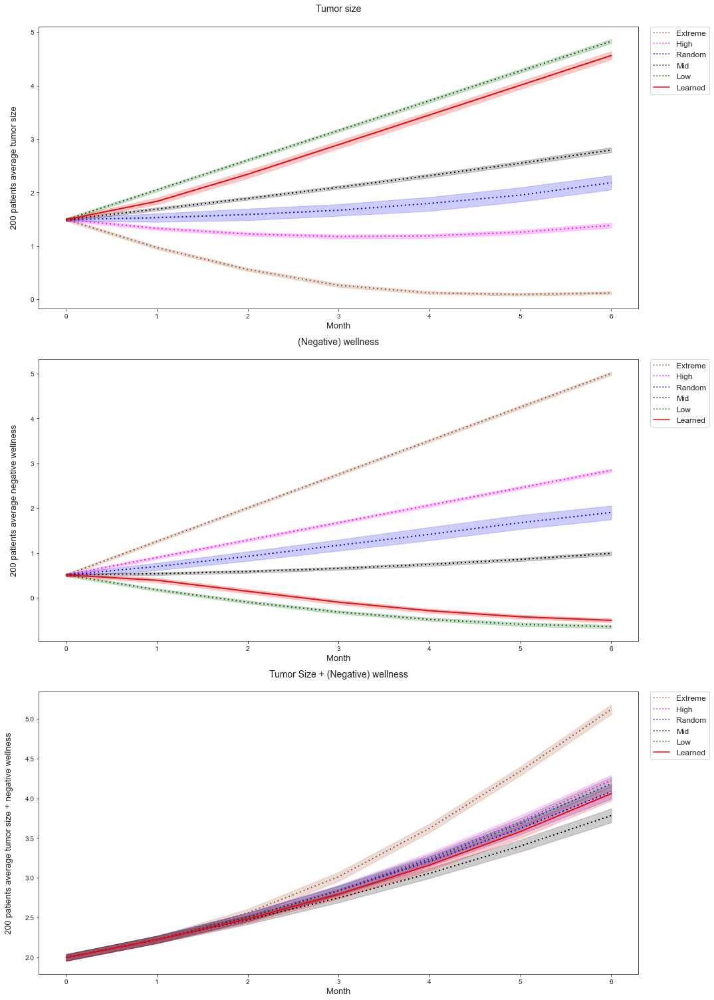


Policy Iteration: 1 - Evaluation results:
                         - Avg. ending tumor size : 4.560704139182711
                         - Avg. max. toxicity : 0.923840371638454
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9698328032825243
                         - Avg. prob. of death : 0.7973419665631302



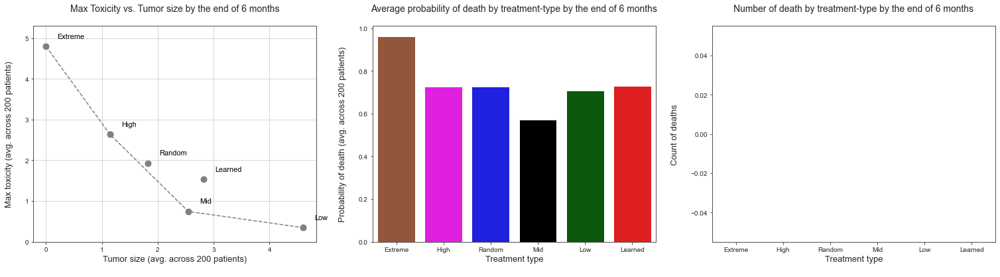

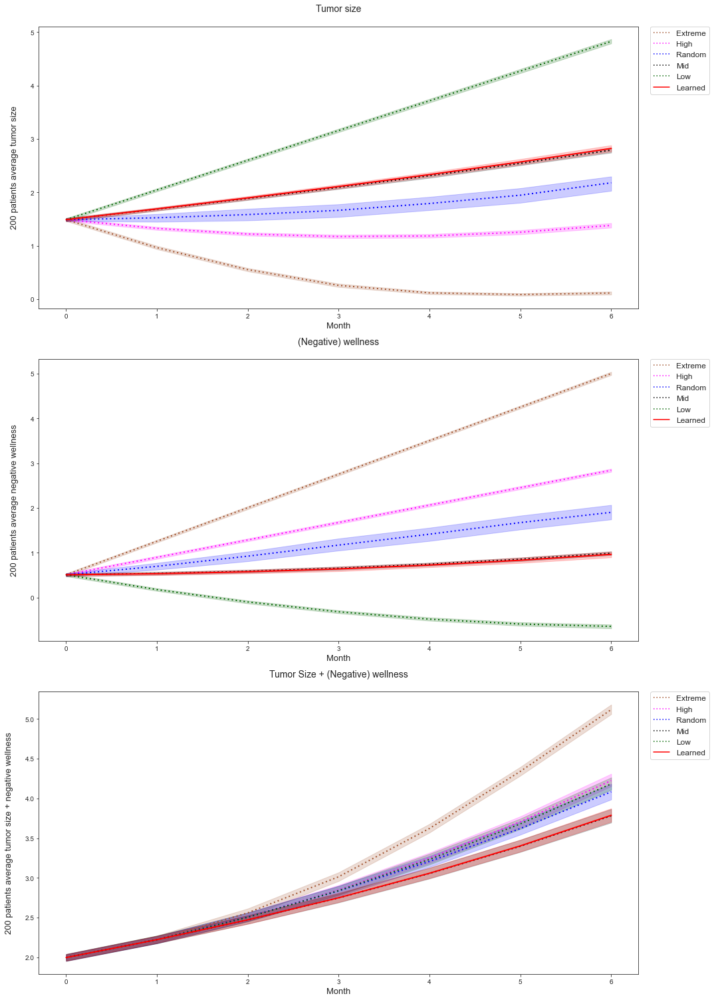


Policy Iteration: 2 - Evaluation results:
                         - Avg. ending tumor size : 2.822412593560464
                         - Avg. max. toxicity : 1.5334422500625657
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9553966275059427
                         - Avg. prob. of death : 0.7298933496748409



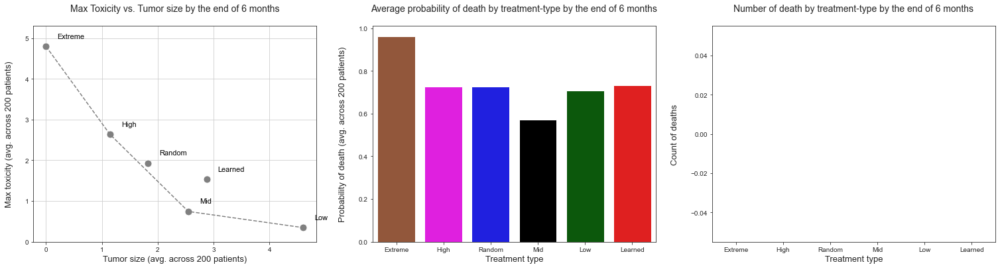

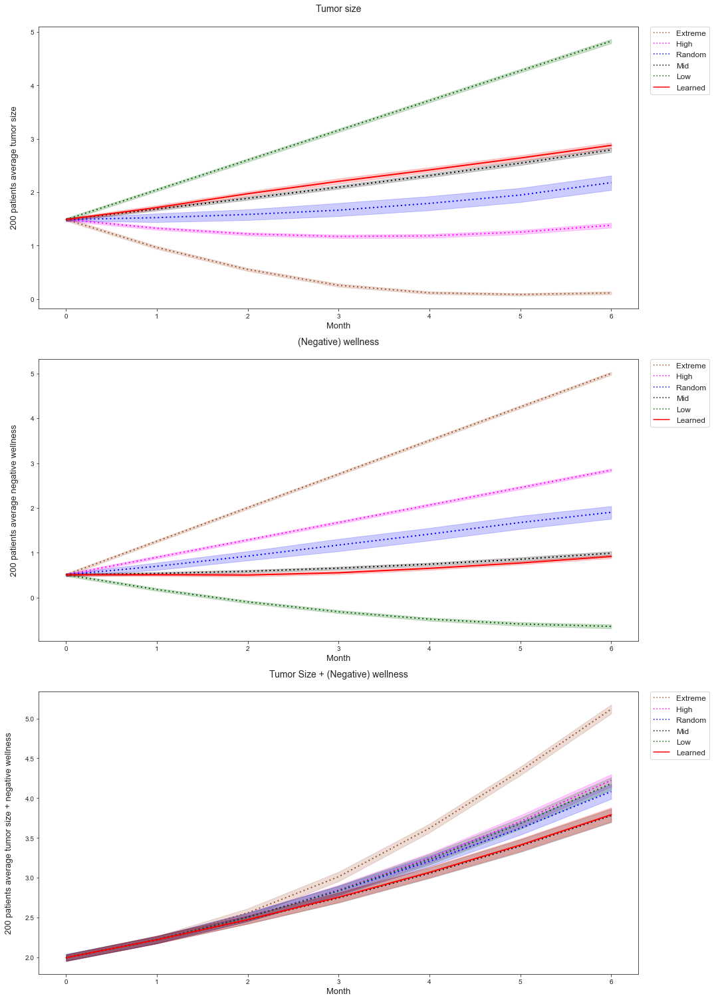


Policy Iteration: 3 - Evaluation results:
                         - Avg. ending tumor size : 2.876296244730828
                         - Avg. max. toxicity : 1.5334120593141933
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9561616186319863
                         - Avg. prob. of death : 0.7314890874976523



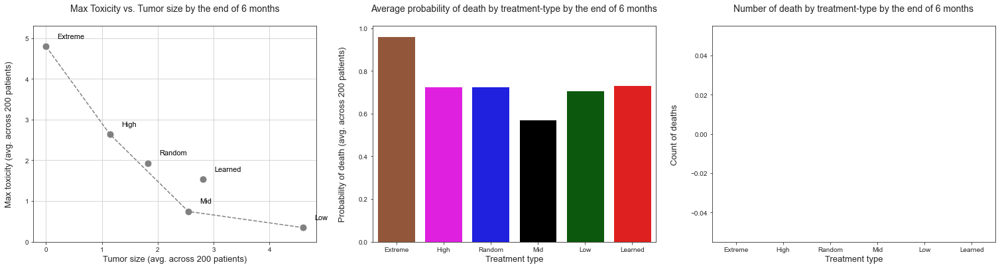

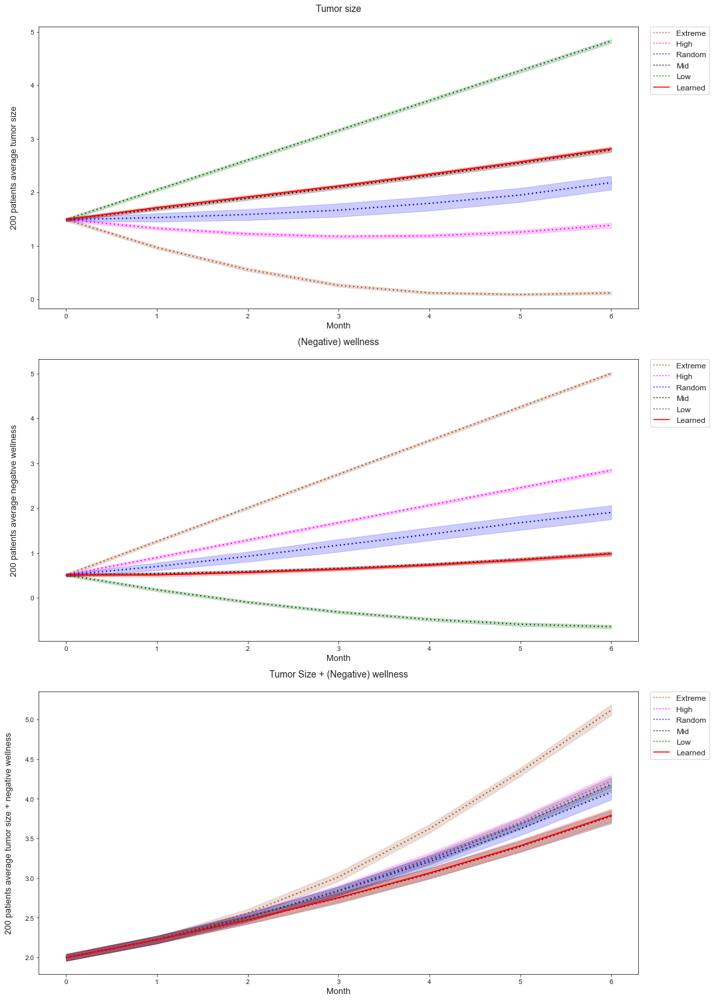


Policy Iteration: 4 - Evaluation results:
                         - Avg. ending tumor size : 2.8125251439489403
                         - Avg. max. toxicity : 1.5334422500625657
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9559188026553818
                         - Avg. prob. of death : 0.7314835734992715



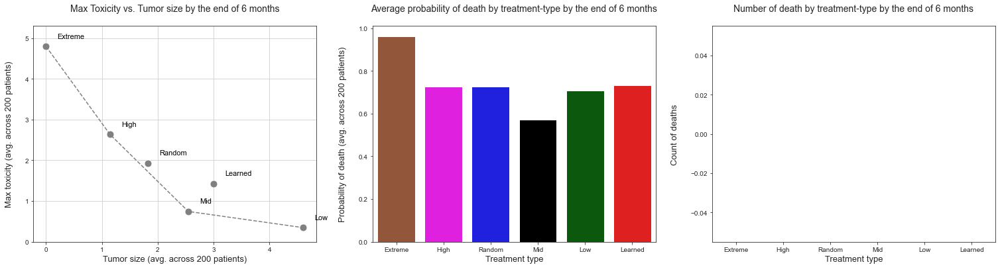

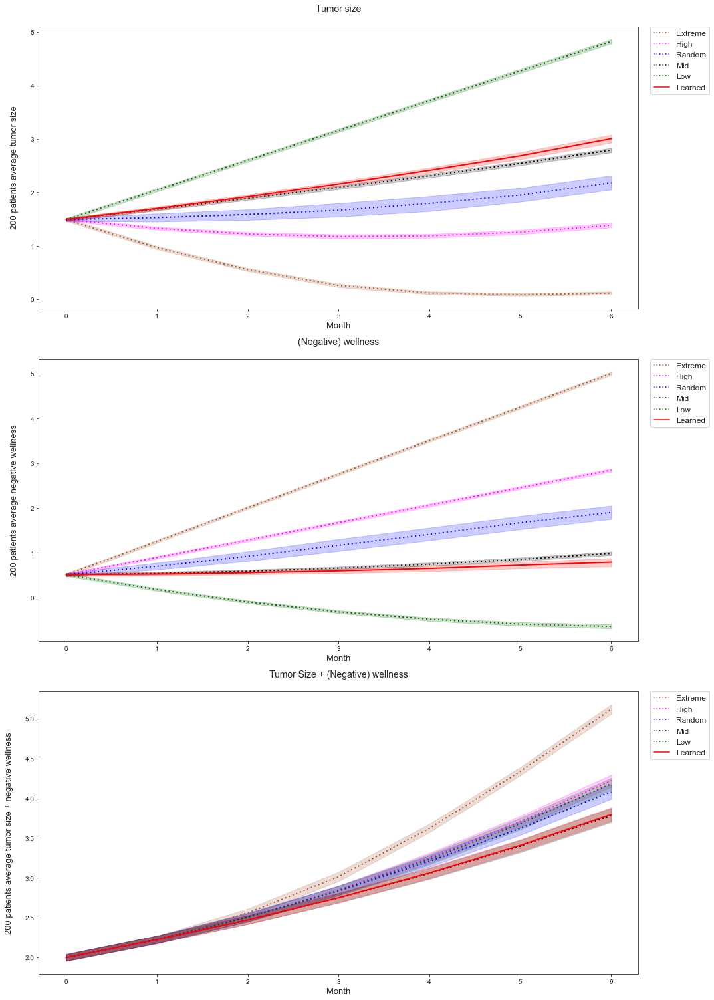


Policy Iteration: 5 - Evaluation results:
                         - Avg. ending tumor size : 3.004958725183119
                         - Avg. max. toxicity : 1.4282899171999017
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9558432368074707
                         - Avg. prob. of death : 0.7323362997356739



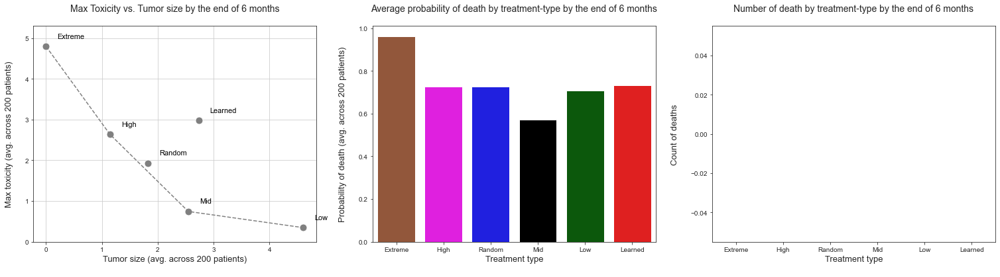

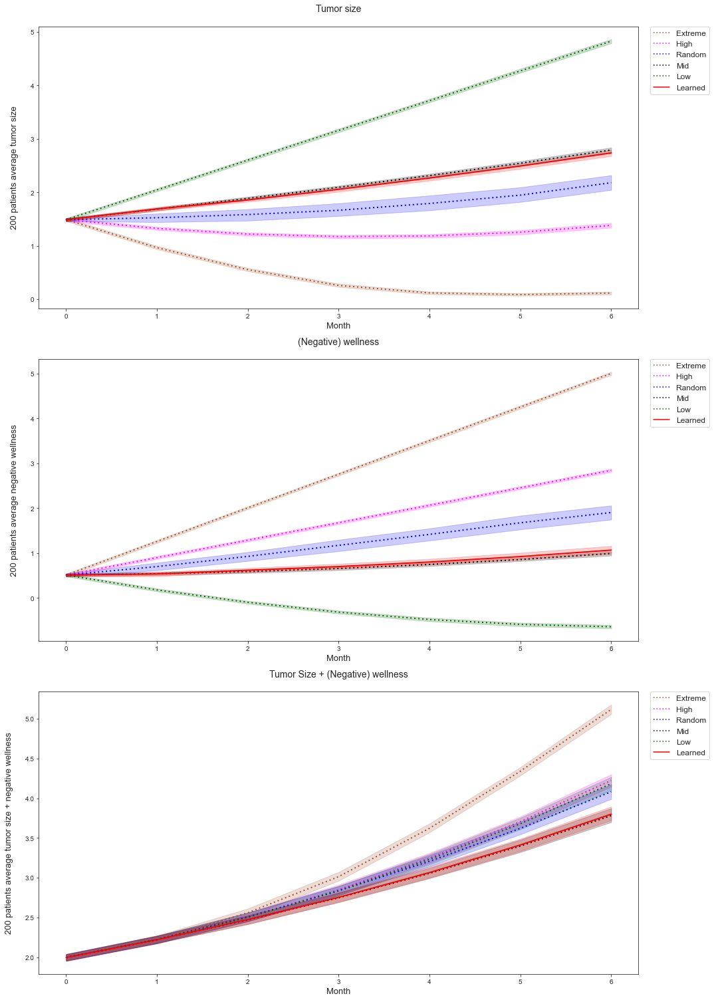


Policy Iteration: 6 - Evaluation results:
                         - Avg. ending tumor size : 2.7359075700559314
                         - Avg. max. toxicity : 2.9794553446959906
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.95630443835941
                         - Avg. prob. of death : 0.7316225157219463



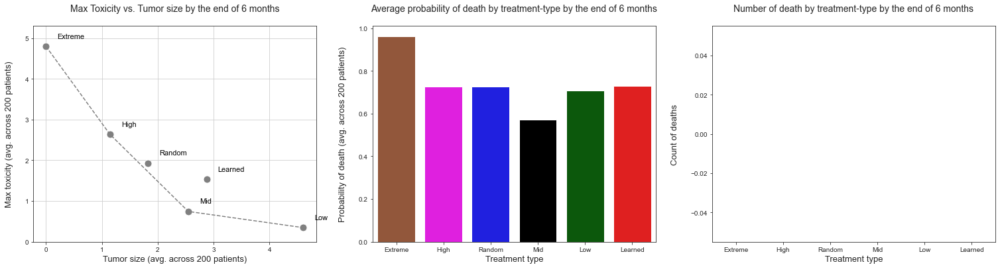

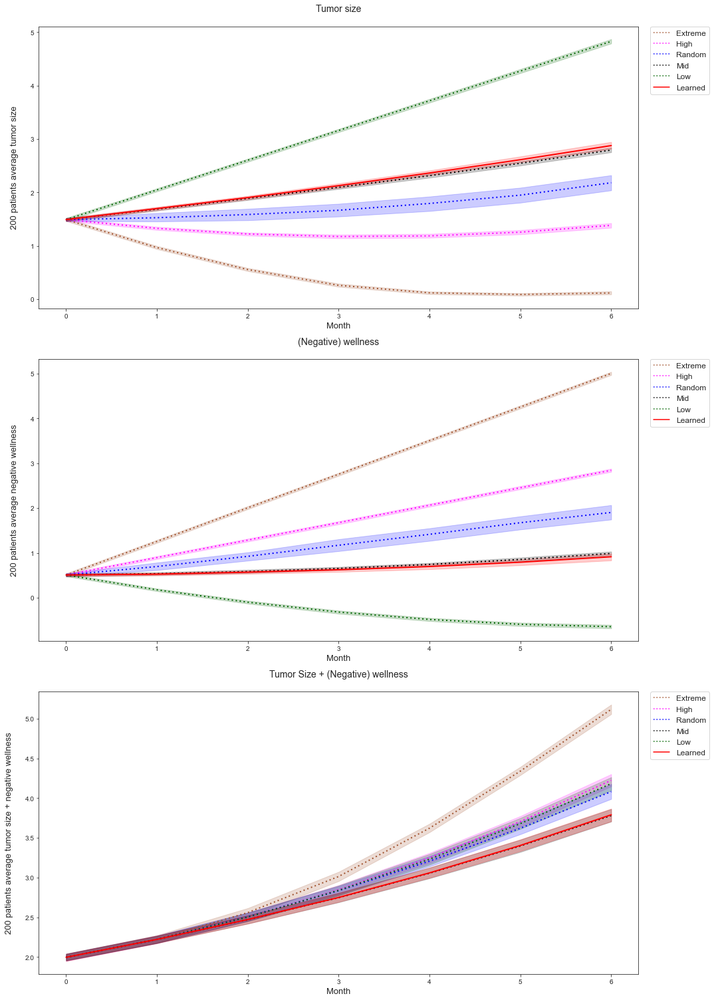


Policy Iteration: 7 - Evaluation results:
                         - Avg. ending tumor size : 2.87536040313174
                         - Avg. max. toxicity : 1.5334422500625657
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9555747864007627
                         - Avg. prob. of death : 0.7306205879374005



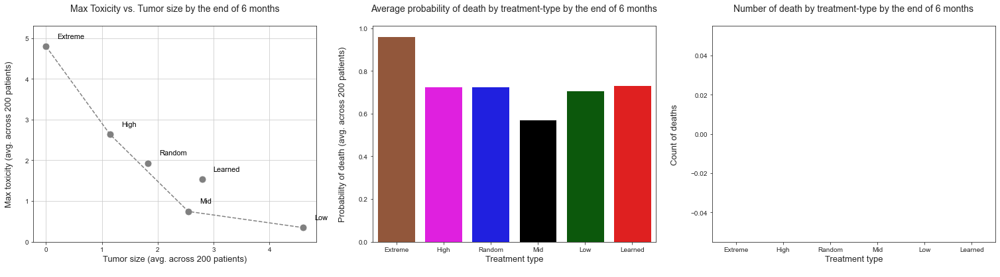

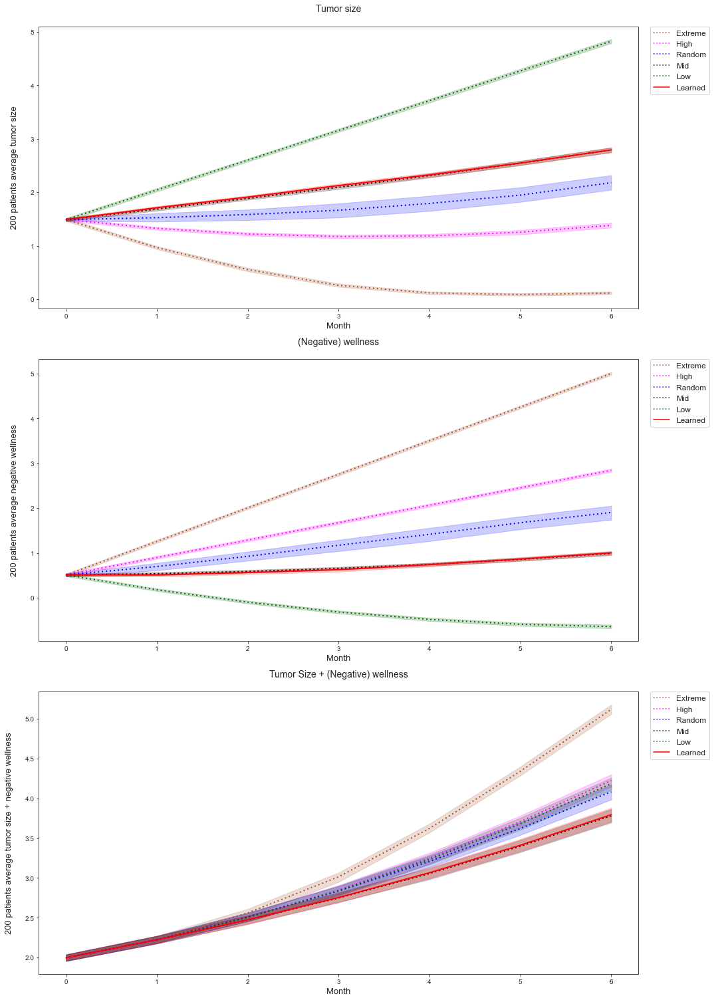


Policy Iteration: 8 - Evaluation results:
                         - Avg. ending tumor size : 2.7931114113160826
                         - Avg. max. toxicity : 1.5334422500625657
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9560584029409833
                         - Avg. prob. of death : 0.7325365786784382



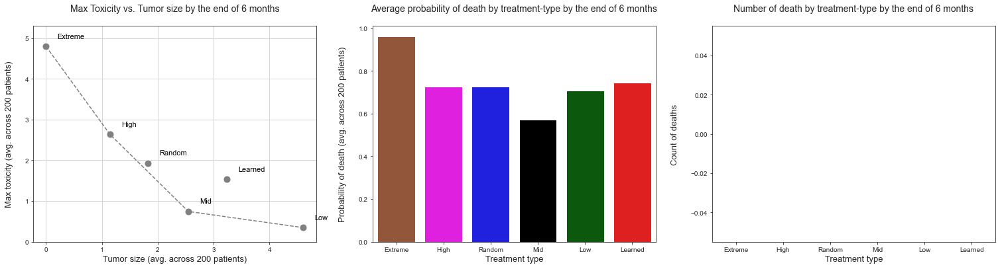

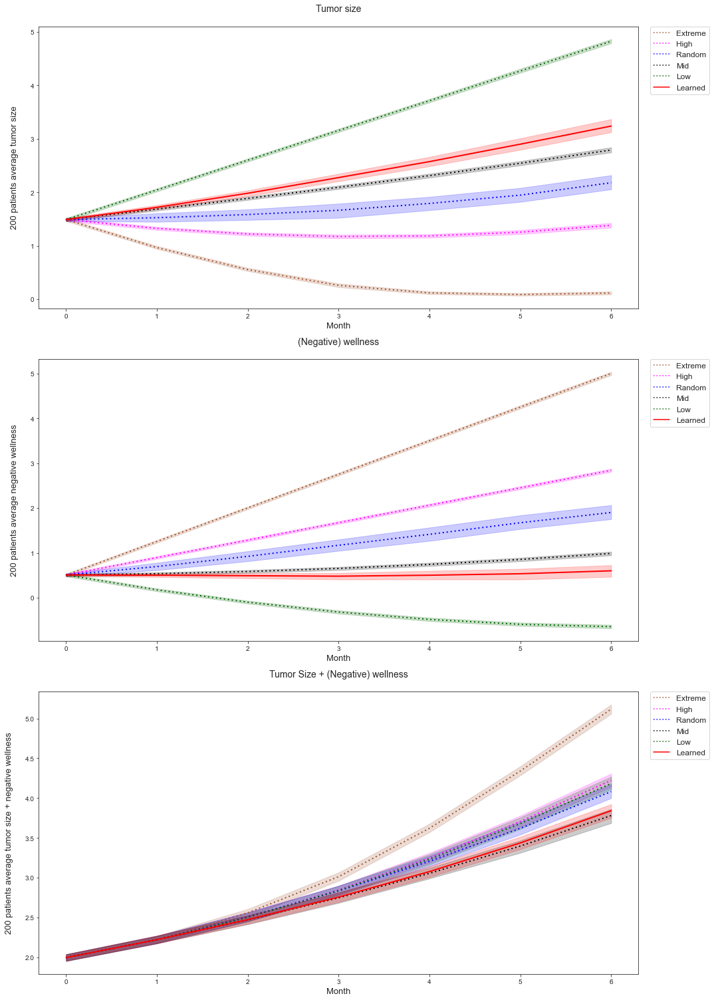


Policy Iteration: 9 - Evaluation results:
                         - Avg. ending tumor size : 3.239783359490322
                         - Avg. max. toxicity : 1.528011544539244
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.958233527600543
                         - Avg. prob. of death : 0.7451819790168912



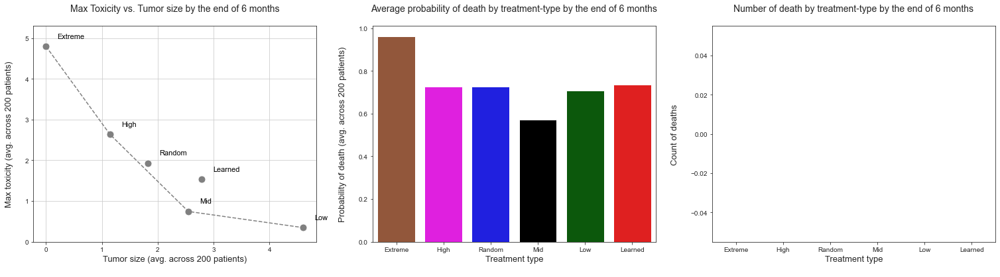

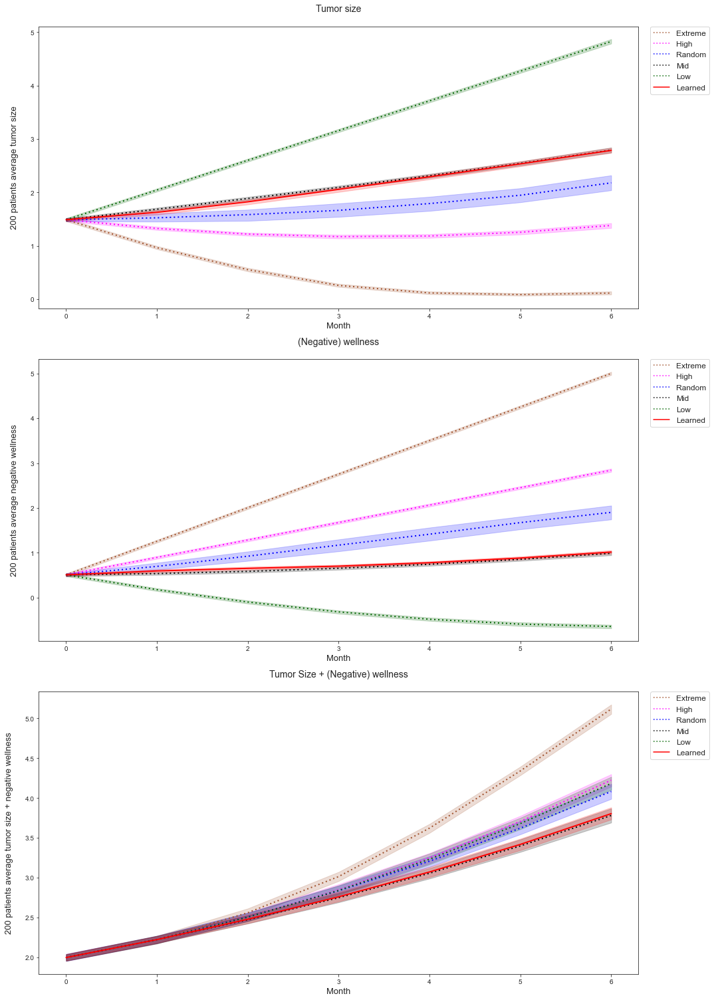


Policy Iteration: 10 - Evaluation results:
                         - Avg. ending tumor size : 2.7870163987303176
                         - Avg. max. toxicity : 1.5337695110928642
                         - Avg. tumor size + toxicity (at the end of 6 months): 2.9568626127793514
                         - Avg. prob. of death : 0.735509719617933


Evaluations: 100%|██████████| 1/1 [2:17:53<00:00, 8273.12s/it]


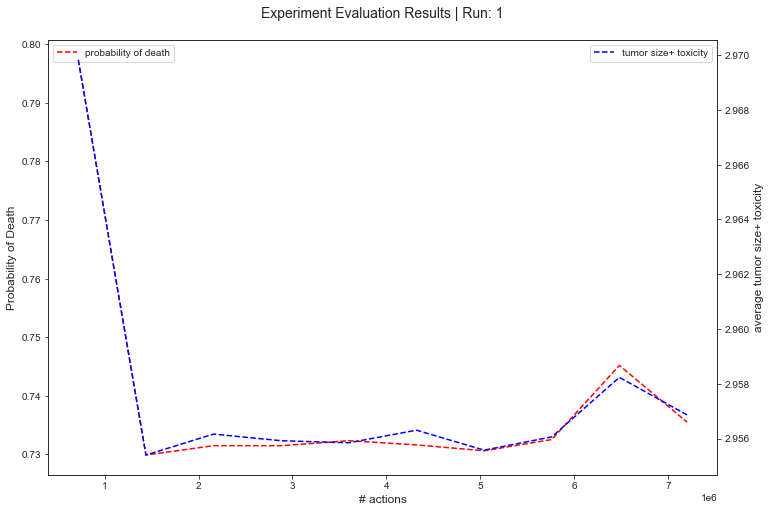

In [9]:
# Experiment execution
agg_results = []

eval_count = len(configs['S'])*len(configs['Actions'])*len(configs['Roll-outs'])*len(configs['Significance'])

pbar_evals = tqdm.tqdm(total=eval_count, desc="Evaluations")

for sample_size in configs['S']:
        
    for rollout_max in configs['Roll-outs']:

        for sig_lvl in configs['Significance']:

            run_results = evaluations_per_config(s_size                     = sample_size
                                                , init_state_group          = configs['init_state_group']

                                                , n_actions                 = configs['Actions'][0]
                                                , max_n_rollouts            = rollout_max
                                                , sig_lvl                   = sig_lvl

                                                , treatment_length_train    = 12
                                                , treatment_length_eval     = 12
                                                
                                                , max_policy_iter_per_run   = 10 # Maximum number of policy iterations per experiment
                                                , runs_per_config           = 1  # Number of experiments per one parameter config

                                                , eval_runs_per_state       = 1  # Episodes to generate from each init. state during evaluation phrase
                                                
                                                , off_policy_explr          = EXPLORE_LOGIC # What algorithm to use

                                                , rollout_tracking          = False # Show rollout info.
                                                , dataset_tracking          = False # Show train dataset

                                                , train_plot_tracking       = False # Show model training plot
                                                , eval_summary_tracking     = True  # Show a policy performance summary of evaluation runs
                                                , policy_behaviour_tracking = False # Show/store policy action selections vs. pendulum angle plot

                                                , show_experiment_run_eval_summary_plot = False # Show death-rate/tumor-size+toxicity vs. action no. plot of exp. run

                                                , use_toxi_n_tumor_for_pref = True # Generate preferences using sum(max-toxi, tumor-size) of rollouts
                                                , set_seed                  = 16
                                                , init_state_tag            = configs['init_state_tag']
                                                )

            agg_results.append(run_results)

            pbar_evals.update(1)
                
pbar_evals.close()